# Model

## Introduction

## What is model?

一個玩具模型是一種刻意簡化的模型，去除了許多細節，同時保留了重要和必要的特徵，以便可以用來簡明地解釋某些事物。

某一主題的“最佳”模型正是該主題本身。然而，大多數時候，一個主題過於複雜，我們無法（或者我們不知道如何）描述它。機器學習模型可以是現實世界中數據關係的數學表示。

問題：為什麼我們需要模型？

## 超參數(Hyperparameter) 與參數(Parameter)的差別?

參數和超參數的差別如下：

1. **參數 (Parameters)**：
   - 參數是模型在學習過程中從數據中獲取的值。它們是模型的內部配置，會隨著訓練數據的不同而改變。例如，線性回歸中的斜率和截距都是參數。

  常見的參數

  權重 & 偏差（Weights & Biases）： 在訓練模型時會不斷進行向前傳遞 ( Forward Propagation ) 與向後傳遞 ( Backward Propagation ) 來學習出最佳的權重與偏差，在神經網路中每個神經元之間的連接權重和偏差是需要通過訓練學習得到的

  斜率 & 截距（Slope & Intercept）： 對線性回歸的任務，模型函數的斜率和截距決定了其預測的表現

  分類閾值（Classification Threshold）： 在二元分類中，決定將預測的概率轉換為類別的閾值。

  決策樹的分支條件： 在決策樹中，每個節點的分支條件（例如特徵和閾值）是需要從數據中學習得到的。

  分類閾值（Classification Threshold）： 在二元分類中，用於決定模型的預測結果是屬於哪一個類別。如果模型輸出的分數或概率超過閥值時，預測為正 ( Positive )，否則預測為負 ( Negative )

  支持向量機的核函數參數： 對於支持向量機，核函數的參數會影響模型的複雜度和性能

  決策樹的分支條件： 對於決策樹，需要從資料中學習到每個節點的分支條件（特徵和閾值）




2. **超參數 (Hyperparameters)**：
   - 超參數是設置模型之前需要手動指定的值，不是從數據中學到的。它們控制訓練過程和模型結構。例如，學習率、正則化係數以及模型的選擇本身（例如決策樹的深度）都是超參數。

   - **示例**：
  - **學習率**（Learning Rate）：控制梯度下降步伐的大小。
  - **正則化參數**：如L1和L2正則化中的係數。
  - **決策樹的最大深度**、**最小樣本分裂數**。
  - **神經網絡中的層數和每層的神經元數量**。

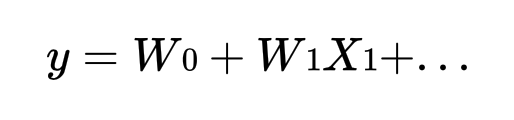

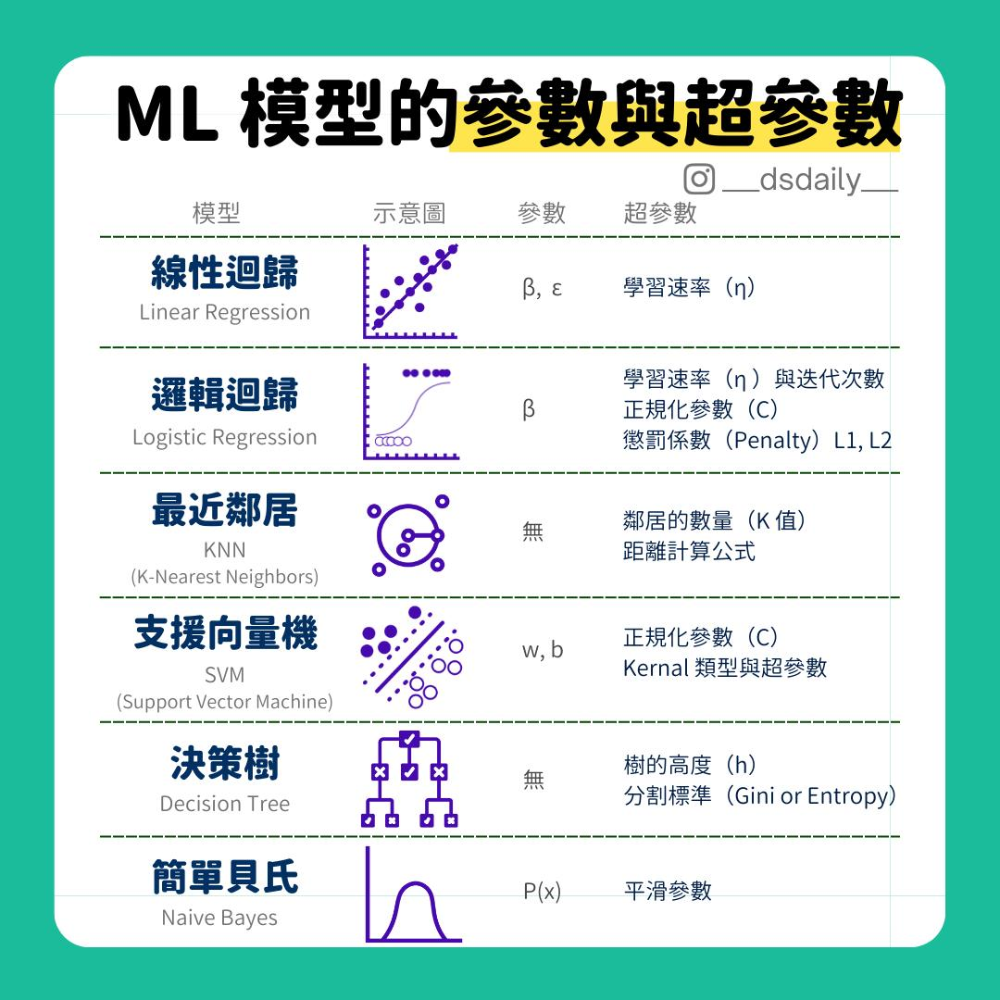

筆記：只要記住，參數（Parameter）是模型自己學習的，超參數(Hyperparameter)是資料科學家自己調整的。調整超參數（簡稱調參），是為了讓模型學習最佳「參數」更好。

以下是一個簡單範例

In [ ]:
from sklearn.datasets import load_iris
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

# 載入 iris 數據集
iris = load_iris()
X = iris.data  # 特徵矩陣
y = iris.target  # 目標變量

# 分割數據集為訓練集和測試集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 創建線性回歸模型
model = LinearRegression()

# 訓練模型
model.fit(X_train, y_train)

# 預測
y_pred = model.predict(X_test)

# 打印參數 (斜率和截距)
print("Coefficients (參數):", model.coef_)
print("Intercept (參數):", model.intercept_)


Coefficients (參數): [-0.10753506 -0.05844926  0.2647557   0.52929416]
Intercept (參數): 0.18080804062267553





在這段程式碼中：

- **參數 (Parameters)**：
  - `model.coef_`：這是線性回歸模型學到的斜率（或係數）。
  - `model.intercept_`：這是線性回歸模型學到的截距。

- **超參數 (Hyperparameters)**：
  - `test_size`：這是將數據集分割為訓練集和測試集的比例。這個值在訓練之前手動設置，並影響模型訓練過程，但不會從數據中學到。
  - `random_state`：這是隨機數生成器的種子，用於確保分割數據集的可重現性。

在這個簡單的線性回歸例子中，模型本身沒有太多可調整的超參數。然而，在更複雜的模型中，例如支持向量機（SVM）或隨機森林，有更多的超參數可以調整，以優化模型的性能。

## 如何找到最好的超參數？




超參數的調整通常需要經驗、實驗和自動化工具的幫助。常見的調整方法包括：

- **網格搜索（Grid Search）**：嘗試所有可能的超參數組合，找到性能最好的組合。
- **隨機搜索（Random Search）**：隨機選擇部分超參數組合進行嘗試。
- **貝葉斯優化（Bayesian Optimization）**：使用概率模型來選擇最有希望的超參數組合。

以下用網格搜尋來找到最佳超參數：

In [ ]:
from sklearn.datasets import load_iris
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split, GridSearchCV

# 載入 iris 數據集
iris = load_iris()
X = iris.data  # 特徵矩陣
y = iris.target  # 目標變量

# 分割數據集為訓練集和測試集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 創建 Ridge 回歸模型
ridge = Ridge()

# 設定超參數網格
param_grid = {
    'alpha': [0.1, 1.0, 10.0],  # 正則化強度
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
}

# 使用 GridSearchCV 進行超參數調整
grid_search = GridSearchCV(estimator=ridge, param_grid=param_grid, cv=5)

# 訓練模型
grid_search.fit(X_train, y_train)

# 最佳超參數
print("Best Hyperparameters:", grid_search.best_params_)

# 使用最佳超參數的模型
best_model = grid_search.best_estimator_

# 預測
y_pred = best_model.predict(X_test)

# 打印參數 (斜率和截距)
print("Coefficients (參數):", best_model.coef_)
print("Intercept (參數):", best_model.intercept_)


Best Hyperparameters: {'alpha': 1.0, 'solver': 'sag'}
Coefficients (參數): [-0.1086083  -0.04793071  0.29603944  0.4546006 ]
Intercept (參數): 0.12688884641747133




---



問題：如何找到最佳參數？



---



https://medium.com/@auscode/%E6%A8%A1%E5%9E%8B%E9%81%B8%E6%93%87%E8%88%87%E8%AA%BF%E5%8F%83-0554dc29a48c

## 模型參數

模型會透過數學的方式，找到一組「最佳的參數」，來達成我們要求的「任務目標」。這件事叫做參數最佳化

### 模型學的是什麼？

首先，我們想像模型是一個 F(x)，他可以讓我們輸入 x 進去之後，會經過數學逼逼坡坡之後，得到 y。這中間的 F(x) 包含一個或是多個「參數」，這些參數會帶領我們輸入的 x 通向不同的 y

做出正確的預測是需要透過不斷的練習與修正的。我們希望找出一種方法可以穩定的修正預測。首先、對一件事情的預測可以用機率方程式來表示的，這使得預測與事實的差距參數化。參數化的好處是可以透過微分法找到最佳解，無論是使用解析法(analytical solution) 或是數值法( numerical solution) 。機器學習稱之為參數的「最佳化」。

以下是白話文

在模型學的過程之間會進行非常多次的小考，模型每次小考所做的預測會與與真實答案會「對答案」。我們有非常多的數學公式可以來評估出模型每次小考的分數，這些數學公式代表著不同意義，不同的情況之下會使用的數學公式都不同。而這些數學公式所算出來的「分數」，我們可以稱呼為「損失 loss」，因此這些數學公式，又被稱為「損失函數 Loss function」。

因此，模型的目標就是去學習如何讓這個 loss 可以越小。在這過程中，他會藉由不斷調整自己的參數（Optimization），來找到一組參數組合，來達成人類的目標。這個過程叫做參數最佳化。

待會會把 Loss function 特別抓出來說。

### 模型如何學習到最佳參數？

### 模型的本質

機器學習是一種非線性轉換的方程式。假設A和B兩組資料集可以透過某個算法，從A集某一個元素，找到B集裡的一個或多個對應的元素，那麼該算法可以稱為轉換方程式，通常在代數數學裡的代號是T，方程式如下式一。機器學習所做的事情，就是找出這個T。

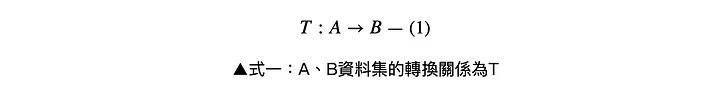

### 模型的輸出是描述機率

我們剛剛知道方程式可以用於描述A資料集與B資料集之間的某種關係。但如果今天這個關係不是必然發生的呢？

「這個AB關係目前看起來好像不是必然的，可能是因為除了烏雲密佈，還有其他必要因素需要被考慮進去。多多測量其他物理量即可解決。」但由於成本有限，所以人類不可能測量全部可能的物理量來推測明天會不會下雨。於是偷懶成性的人類導入了機率這個概念。既然AB之間不必然會接連發生，那麼就多觀測幾次，看看A(烏雲密佈)之後，有幾次B(下雨)也發生了。

我們把選項寫多一點，換個情境：

例如今天你的遠房親戚到你家拜訪，炫耀地拿出他們家去東非肯亞與稀有動物的合照。他知道你學識淵博，問你那隻動物叫什麼名字。

此時A資料集就是世界上眾多動物照片的其中一張。因為你那親切的遠房親戚已經指定好了希望你回答的照片，所以在這個命題裡，我們不用考慮A資料集的其他元素作為前提的情況。B資料集就是動物的種類，有見過的也有許多沒見過的。你決定孤注一擲，猜一個看起來差不多的動物，於是我們的大腦成了轉換T

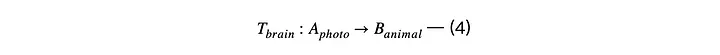

假設在某個宇宙中，那裡的地球上只有四種動物Alpha、Beta、Gamma及Human（人類）。跟據學校教的知識，你猜這張圖為這四種其中一種動物的機率為0.60、0.25、0.10及0.05。上述說法可以寫成下面的式五：

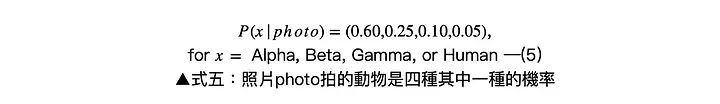

值得注意的是，遠房親戚拍的這張動物照片，實際上只對應到一隻動物。但由於我們並沒有足夠的知識回答這個問題，所以我們只能用「猜」的，我們的大腦形成了一個機率分佈P 來描述AB之間的關係，但這未必是AB之間真正的關係。

這時候，你有了你腦中認為的四種選項的機率分佈（預測分佈），以及真實答案中四種選項的機率分佈（真實分佈）。

### 機器如何猜的準？

讓機器猜得更準是一個大問題，我們要拆解它，變成兩個主要的小問題。第一、我的預測與真正的答案差多少？第二、要如何讓預測更接近真實。

面對第一個小問題，我們可以機率化我們的預測，然後直接跟真實解答做比較。

第二個問題，普遍的作法是將「預測與事實差距」作為一個方程式，微分它並找到微分為零的點，若能找到，此時的方程式就是最佳的猜題策略了。

### 小問題1: 預測與真實差距多少？

要能夠猜的更準，你需要學習與改進。然而你要藉由這次的機會學習到些什麼，你要先了解，你的猜測與真實的答案差距多少，下一個問題才是，怎麼學好。

我們可以機率化我們的預測，然後直接跟真實解答做比較。你回憶了剛才的預測P(x| photo)：Alpha為0.6、Beta為0.2、Gamma為0.15、還有Human（工作人員假扮）的機率為0.05。由於事實上圖中的動物就是Alpha，所以Alpha實際上是1，其他物種的可能性為零。我們把預測與真實的機率P_real(photo| x)相減，如下表二：

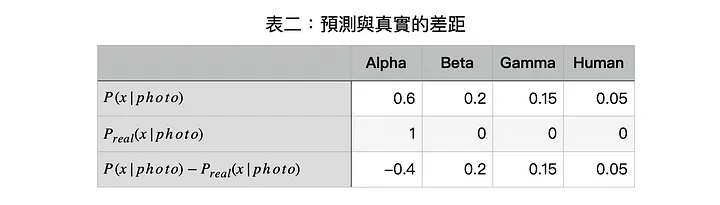

是否可以用更簡單的數學量，來表示我們猜測與答案的差距呢？因為如果能用一個純量表達的話，就更容易衡量不同預測之間的差距了。

此時剛好國中的數學老師過來拜訪你，他覺得可以用「平均而言，這個轉換有多令人驚訝」來表達，因為猜錯的話我們多少會感到驚訝。假設驚訝的程度可以被數值化，我們希望機率越低的選項擁有越高的驚訝值，因為它很少出現，一出現就會導致我們手足無措。令平均驚訝值(surprise)為預測與現實之間的差距，你隨筆寫下算法如下式六：

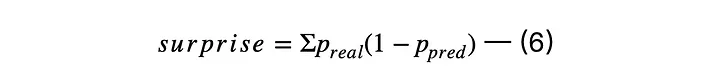

然而這樣的算法有一個致命的缺點，那就是驚訝值的最大值會發生在p_i=0.5，跟我們的假設不合。我們希望越少發生的事件對驚訝值有越大的貢獻。你的數學老師認為用-log(p)表達有多驚訝事件p會發生會更好。令驚訝值為-log(p)、平均驚訝值為surprise。

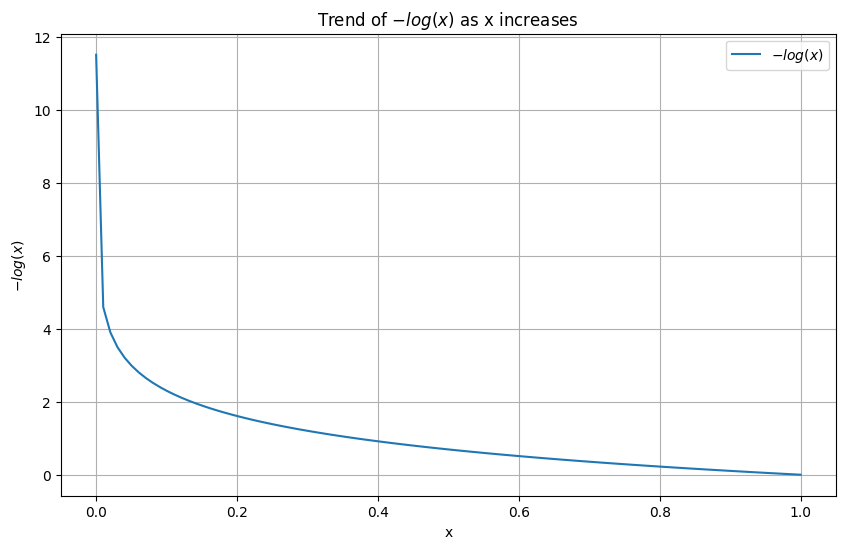

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 定義 x 的範圍，從 0.1 到 100，避免 log(0) 導致的數學錯誤
x = np.linspace(0.00001, 1, 100)
y = -np.log(x)

# 繪製趨勢圖
plt.figure(figsize=(10, 6))
plt.plot(x, y, label=r'$-log(x)$')
plt.xlabel('x')
plt.ylabel(r'$-log(x)$')
plt.title(r'Trend of $-log(x)$ as x increases')
plt.grid(True)
plt.legend()
plt.show()


老師借你的筆寫下式七：

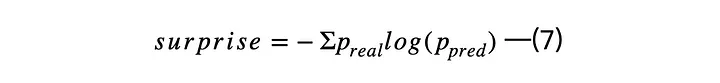

只要能夠表達出：第一、越少發生的事越令人驚訝；第二、驚訝的程度會隨這機率的降低而加速成長（不只是成長，而是加速成長）。滿足這兩個條件就是好的定義。

為什麼式七左邊的p是用p_real 而不是p_pred 呢？請讓我凸顯一個事實：「我們認為它是什麼動物」跟「事實上它是什麼動物」的機率分佈並不相同。我們認爲他是多種動物的其中一種，但實際上從他打出生開始就是Alpha了。所以「平均驚訝值」應該以真實的機率p_real作為權重，以自己的預測為驚訝值，才是合理的估算。因為這是一個很公正的方式用來評量自己有多驚訝。

假設有另一個人已經知道照片上是什麼動物了，也做出了預測，如下式八。毫不意外地，他的預測是100% 的Alpha，此時他的平均驚訝值為0。（註：對於已經知道答案的人而言，平均驚訝值不一定是零。如果該事物的本質就具有不確定性的話，那平均驚訝值就必然大於零。）從數學上可以證明，不可能有人可以得到更低的平均驚訝值，因此這是一個很好的基準點。將基準點與自己的平均驚訝值相減後，得到的純量可以代表預測與事實之間的差異。那我們應該如何利用他呢？

補充：「平均驚訝值」就是「交叉熵(cross entropy)」，意思是如果用一個預測來描述一個事實的話，其預測出錯的程度。 然而事實本身也有不確定性，數學上叫做熵 (entropy)，意思是用事實機率取樣兩次，兩次得到的結果不同的程度。

到的純量可以代表預測與事實之間的差異。那我們應該如何利用他呢？普遍的作法是將「預測與事實差距」作為一個方程式，微分它並找到微分為零的點，若能找到，此時的方程式就是最佳的猜題策略了。我們令平均驚訝值surprise和基準點\hat{surprise}相減為Divergence（簡稱D）

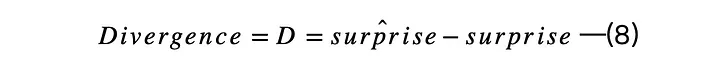

在資料科學和機器學習中，“divergence” 是一個重要的概念，用於衡量兩個機率分布之間的差異。常見的 divergence 包括 Kullback-Leibler (KL) divergence 和 Jensen-Shannon (JS) divergence。

再進行微分之前，我們先將問題轉化成簡單一點的數學公式：

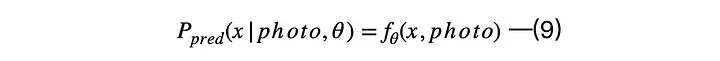

式九的意思是，一個由參數theta調控的轉換，認為photo中的動物為x的機率為P_pred(x | photo, theta)。theta 不一定是一個參數，它通常是一組數、由多個獨立的參數組成。如此一來預測與現實的差距(D) 就可微了，為求方便，我們把P_real 簡稱為p；P_pred 則由另一個字母q 替代，並且用字母i來代表不同的預測選項：

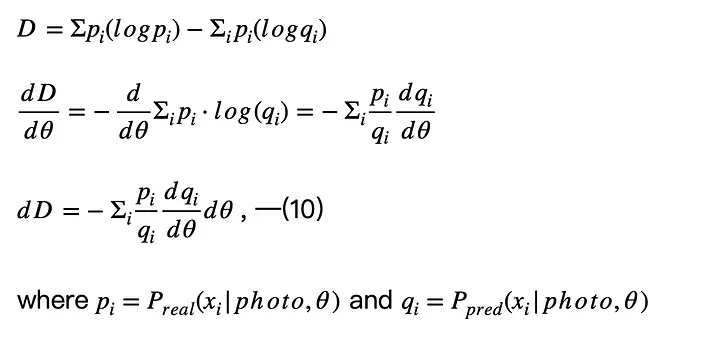

p 對theta 微分必為零，因為p 是真實的機率，與我們的預測無關，所以可忽略不寫。dq/d theta可以從黑盒子微分求得。這個方程式告訴我們如果要讓預測與事實的差距(D) 變小，則黑盒子的參數(theta)應該要調整多少。事實上我們很難透過這個微分方程式直接找到最佳解，因為這樣的微分方程式有很多個，數量由theta的參數數量決定。為了提高方程式的能力，Theta通常有成千上萬個參數。解出「萬元聯立微分方程式」並不現實，實際上工程數學的二元一次微分方程式就已經夠嗆的了。但如果我們只從出發點走非常小的一步，那麼不同參數之間的影響就可以忽略，使得式十可以近似於式十一：

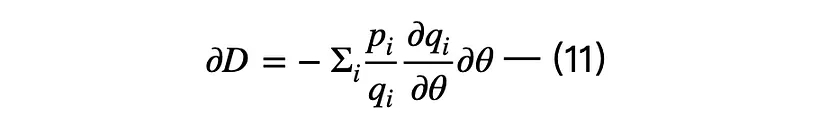

式十一的微分方程式的數量跟Theta參數的數量是一樣多的。我們忽略了參數之間的影響，但沒有減少方程式的數量。至此我們將問題簡化為多個常微分方程式，計算的難度大大降低。接著使用數值法(numerical solution)就可以一步一步的更新參數，直到接近最佳解。此時，你就知道你就會開始像是一個滑學高手開始更新參數，直到最低點。你就會開始計算「梯度」。

### 小問題2: 要如何往更接近真實改進？

先知道，更新參數就像在滑雪，滑雪選手不斷的往低處（較佳解）走，根據地形（參數空間）隨時改變前進方向，最後在最低處（最佳解）停下來。這時候，這位滑學選手需要知道兩件事，第一是「往哪邊滑」、第二是「滑多少」



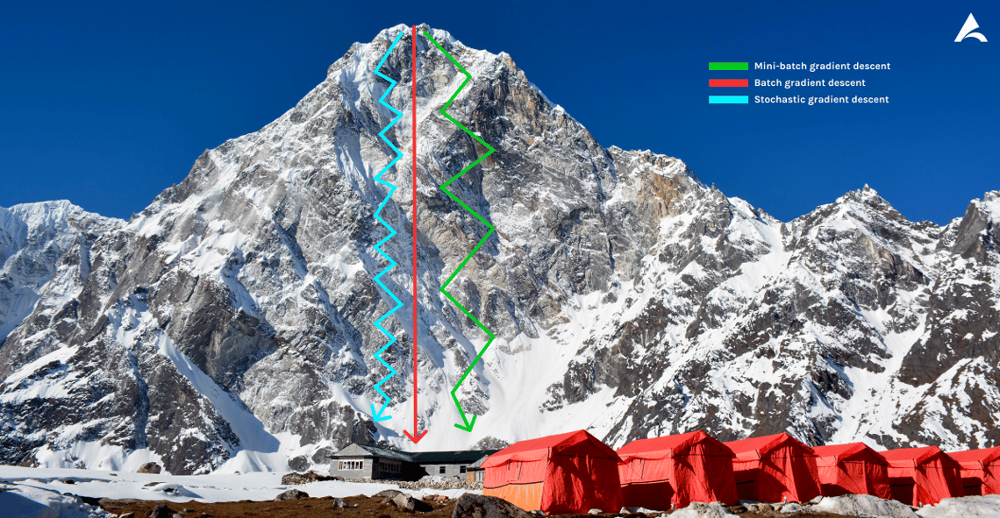

參考資料：
1. [機器學習、轉換與猜測
](https://jacob975.medium.com/%E6%88%91%E7%9A%84%E6%A9%9F%E5%99%A8%E5%AD%B8%E7%BF%92%E6%89%8B%E7%A8%BF-%E7%95%B6-%E7%8C%9C%E7%AD%94%E6%A1%88-%E6%88%90%E7%82%BA%E4%B8%80%E7%A8%AE%E8%BD%89%E6%8F%9B-e9eaed856ca7)
2. [剖析深度學習 (2)：你知道Cross Entropy和KL Divergence代表什麼意義嗎？談機器學習裡的資訊理論
](https://ycc.idv.tw/deep-dl_2.html)

### 梯度（Gradient）

#### 梯度（Gradient）是什麼

訓練模型的時候，我們的目標是讓損失函數越小越好，我們通常會設計一個極限存在、連續圖形、可以微分的損失函數，藉此我們就可以透過微分的運算來找出最佳的模型參數。凹口向上的拋物線即為一個Convex Function，或者讀者可以想像成兩座山中間夾著山谷，而我們的目標則是要「從山頂一路向下走到谷底」。

因此，我們透過對損失函數微分的方式，來找到前往損失最小值的方向。

梯度算的是最小值的梯度，這個梯度指向的可能是全局的最小值，也可能只是區域的最小值。

一維度的純量x的梯度，通常用f'(x)表示。
多維度的向量x的梯度，通常用∇f(x)表示。

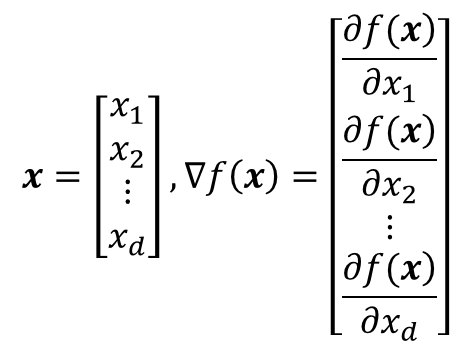

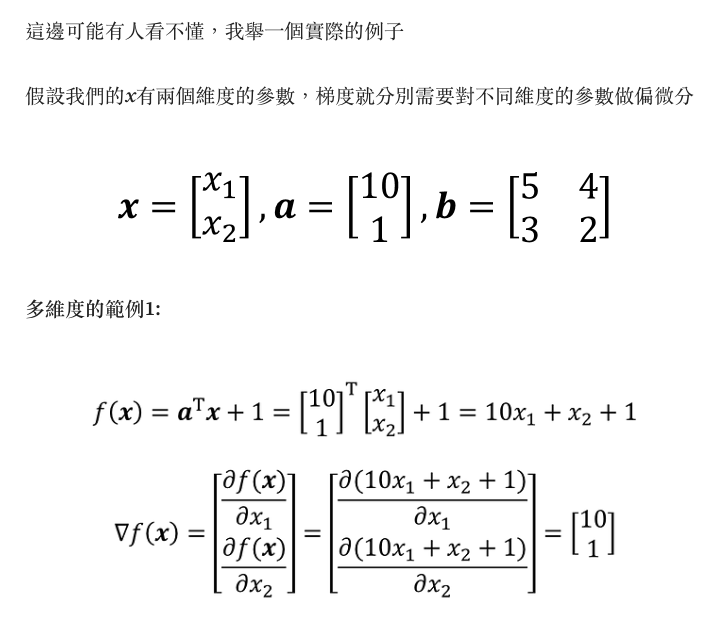

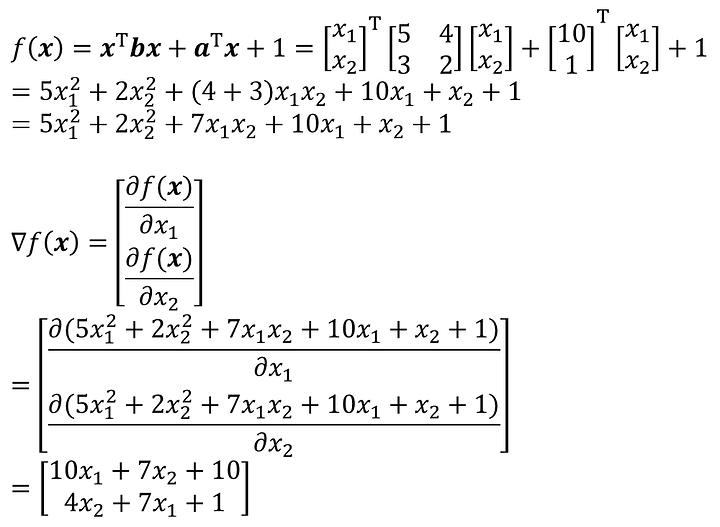

一個很重要的地方值得注意的是，梯度是有方向的，對於一個向量θ，每一維分量θi都可以求出一個梯度的方向，我們就可以找到一個整體的方向，在變化的時候，我們就朝著下降最多的方向進行變化就可以達到一個最小點，不管它是局部的還是全局的。



倒三角代表的是梯度的意思，在這裡指的是針對 f(x) 的梯度公式。我們可以將每一次模型所學到的參數丟進去這項公式裡面，梯度公式就會告訴我們最小值的方向，我們再朝它前進。

用滑學比喻：滑學選手要到的是這座山谷的最低點，他有一個很酷的指南針，這個指南針可以偵測比較低的區域所在，但指南針所指的方向不一定是整座山谷的最低點，也可能只是該區域的低點。

因此他的策略是什麼呢？我們接著看下去


嘻嘻哈哈，你會算梯度了

#### 梯度下降法(Gradient Descent)

梯度下降法，就是把算好的梯度拿來用的方法。

梯度下降法(gradient descent)是最佳化理論裡面的一個一階找最佳解的一種方法，主要是希望用梯度下降法找到函數(剛剛舉例的式子)的局部最小值，因為梯度的方向是走向局部最大的方向，所以在梯度下降法中是往梯度的反方向走。

梯度下降法是一種不斷去更新參數(這邊參數用x表示)找「解」的方法，所以一定要先隨機產生一組初始參數的「解」，然後根據這組隨機產生的「解」開始算此「解」的梯度方向大小，然後將這個「解」去減去梯度方向，很饒舌，公式如下:

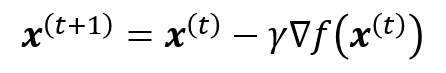

這邊的t是第幾次更新參數，γ是學習率(Learning rate)。

梯度算的是最小值的梯度，這個梯度指向的可能是全局的最小值，也可能只是區域的最小值。

當梯度的方向我們知道了，但找「解」的時候公式是往梯度的方向更新，一次要更新多少（要走多大步），就是由學習率來控制的，後面會有範例說這個學習率影響的程度。



你可能會想，既然我們已經找到了梯度的公式了，為何不能一步到位？

最好理解的原因是：因為函數的長像彎彎曲曲很多次，有局部極值或鞍部，所以一次維分等於0求得的可能是極值，也可以是相對極值。因此，不是每一種函數都有最大值和最小值。

舉個例子：

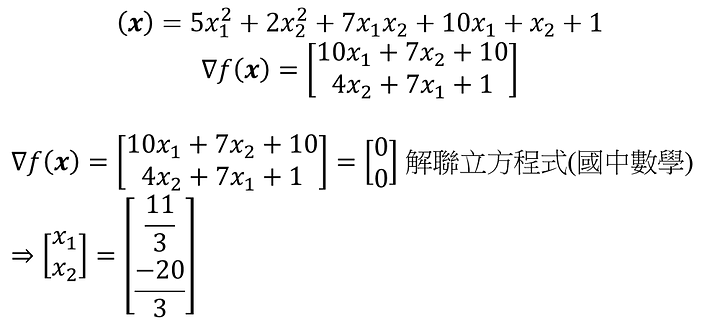

這個方程式可以找到極值「解」讓f(x)最小(f(x)=16)，但這個值真的是最小嗎?


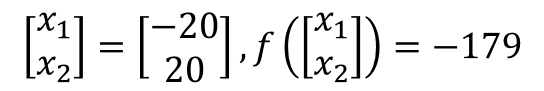

這個值比微分的最佳解還要小，所以可以得知微分等於0找到的不一定是最佳解，所以用梯度下降法，可以找到更好的解。



我們回來，我們來看看梯度下降的步驟：

梯度下降法是按下面的流程進行的：
1）首先對θ賦值，這個值可以是隨機的，也可以讓θ是一個全零的向量。
2）改變θ的值，使得J(θ)按梯度下降的方向進行減少。

為了更清楚，給出下面的圖：

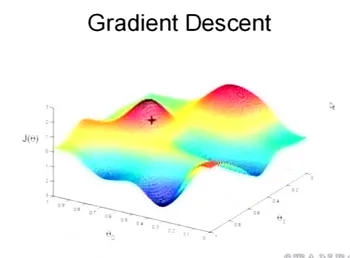

這是一個表示參數θ與誤差函數J(θ)的關係圖，紅色的部分是表示J(θ)有著比較高的取值，我們需要的是，能夠讓J(θ)的值盡量的低。也就是深藍色的部分。θ0，θ1表示θ向量的兩個維度。

在上面提到梯度下降法的第一步是給θ給一個初值，假設隨機給的初值是在圖上的十字點。

然後我們將θ按照梯度下降的方向進行調整，就會使得J(θ)往更低的方向進行變化，如圖所示，算法的結束將是在θ下降到無法繼續下降為止。



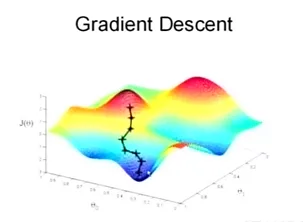

當然，可能梯度下降的最終點並非是全局最小點，可能是一個局部最小點，可能是下面的情況：



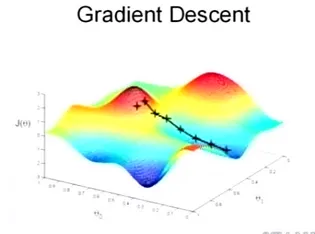

上面這張圖就是描述的一個局部最小點，這是我們重新選擇了一個初始點得到的，看來我們這個算法將會在很大的程度上被初始點的選擇影響而陷入局部最小點



梯度下降法的步驟：

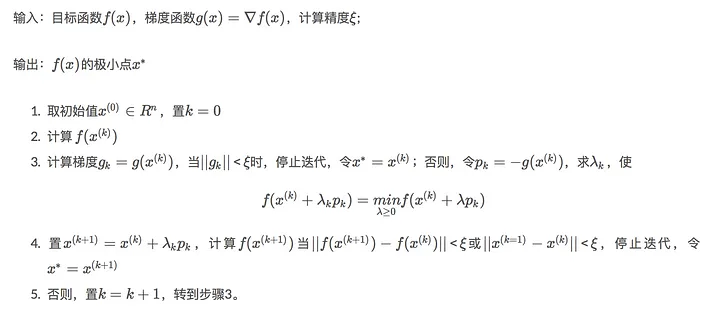

用滑學比喻：滑學選手設定他的策略是，他要每滑一段距離就停下來將現在的座標輸入進去指南針中，讓指南針告訴他方向。而這位滑學選手在一開始被教練設定好每次可以滑多少距離。因此，他會按照這些指示，滑到下一個點。

就這樣一次又一次反覆滑、確認、滑、確認後，他會抵達一個可以接受的海拔高度，就會停止。然而，他無法保證他到的位置是哪裡，如果很幸運，他會成功抵達山谷最低點，開開心心的回家。如果不幸運，他可能還停留在山上的某個河谷中。


##### 如果你對計算原理有興趣

我們先考慮一個變數的狀況，假設f是我們的損失函數、目前模型的參數是x，我們想在x附近找到一個更好的參數來最小化損失函數f，該怎麼做？我們可以將損失函數f對x附近的某一點做泰勒展開式：

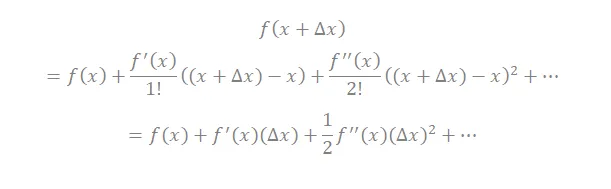

現在我們的目標是要找x附近的某一點，可以讓損失函數最小，用數學來表示如下：



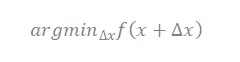

帶入泰勒展開式，可以得到：



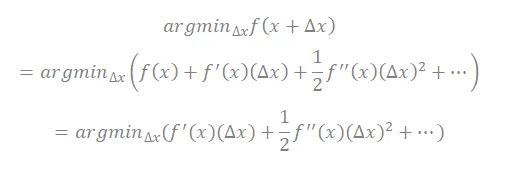

當我們在尋找一個可以讓損失函數最小的點，是不用考慮f(x)，因為不管我們找哪一個新的點，這個新的點都不會改變f(x)的數值。既然是一個常數，那我們就不要理它。

一個可以讓損失函數最小的點，代表損失函數在這個點的斜率，也就是一階微分，等於0。所以我們可以透過微分來解出最佳的點：



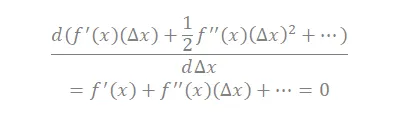

假設我們找的點，距離x非常的近，我們可以得到以下近似結果：



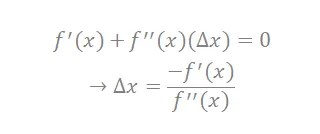

因此，在x附近，可以讓損失函數最小的點為：



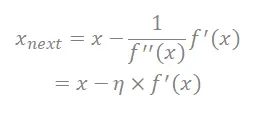

上述公式即為我們熟知的梯度下降法！因此在梯度下降法，我們**假設了「每次都在距離現在參數不遠的地方，找一個新的參數可以最小化損失函數」，**因此，我們只能重複執行梯度下降法很多次，每一次都只改變一點點參數值。如果一次改變太多，梯度下降法並不保證可以得到更好的模型參數。

此時，可以發現所學習率跟「函數的二次微分的倒數」有關。這也是為什麼通常不斷地改變學習率，可以得到比較好的最佳化參數，畢竟函數的二階微分不太可能是定值。而有一些梯度下降法的強化版，主要就是想辦法近似函數的二階微分值。

### 梯度下降的視覺化

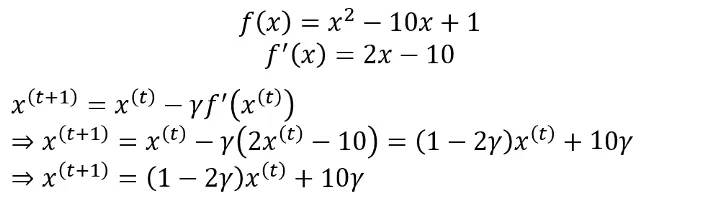

紅色的點是每一次更新找到的解

紅色線是法線，藍色線是切線，法線和切線這兩條線是垂直的，但因為x軸和y軸scale不一樣，所以看不出來它是垂直的。

學習率是0.01


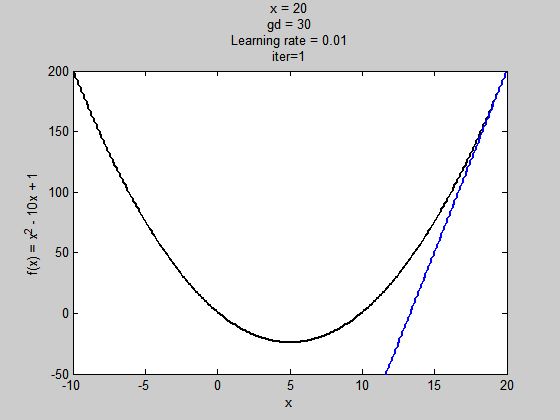

學習率是0.1


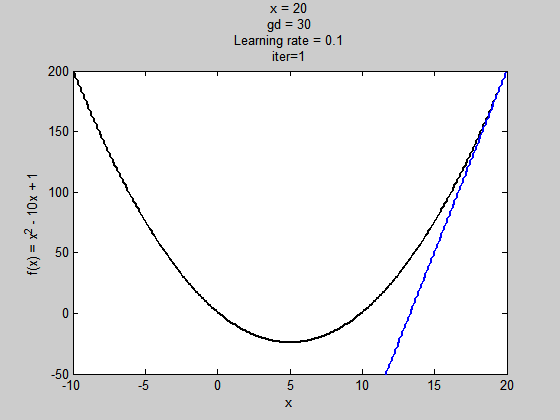

學習率是0.9


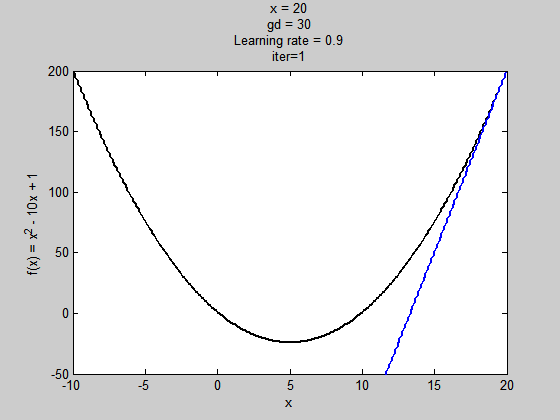

學習率是1


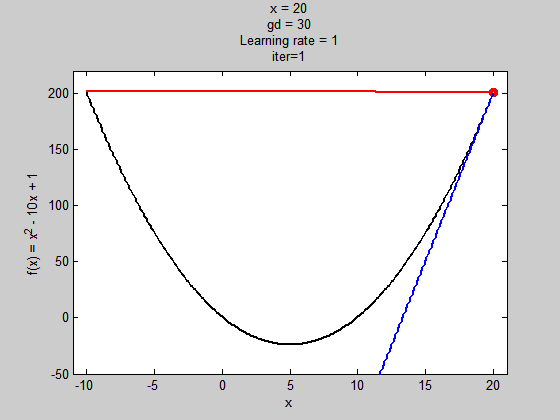

由上圖我們可以發現學習率對找解影響很大，學習率太低，需要更新很多次才能到最佳解，學習率太高，有可能會造成梯度走不進去局部極值(但也可以擺脫局部極值的問題，等等有範例)。這邊尤其是當學習率是1的時候，基本上梯度下降法根本走不到局部極小值，一直在左右對跳，所以最佳化理論有很多衍生的方式或更先進的方式去解決這些問題(這邊先不介紹)。

來看看有局部極小值和全域極小值的函數

學習率是0.00001

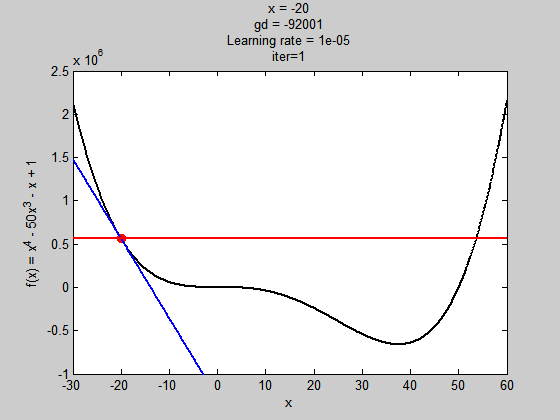

學習率是0.0004


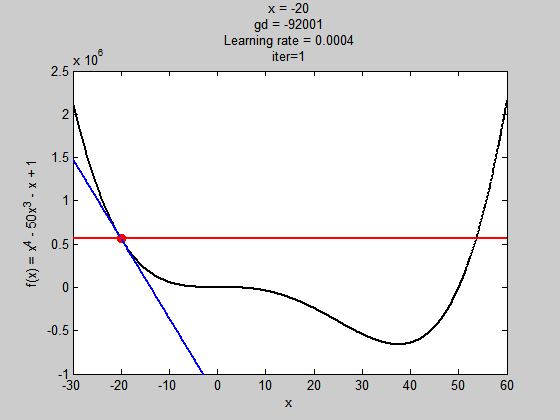

這個學習率(0.0004)對此例子來說，雖然步伐夠大跳出了局部極值，但到全域極值時，因為步伐太大，所以走不到最好的值。

學習率是0.0003


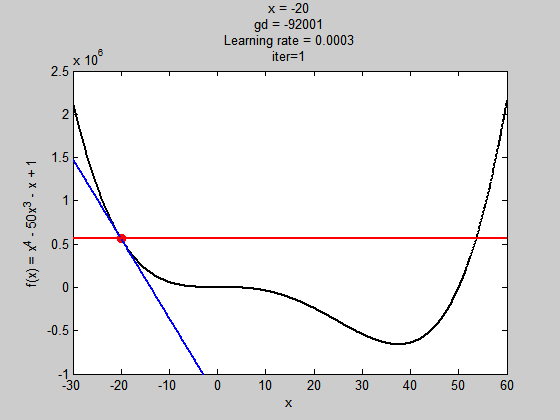

有很多手法(比如牛頓法， momentum或是Adam)可以避免上述問題，或是讓解找的更快，這些內容會放在 optimization 中介紹。

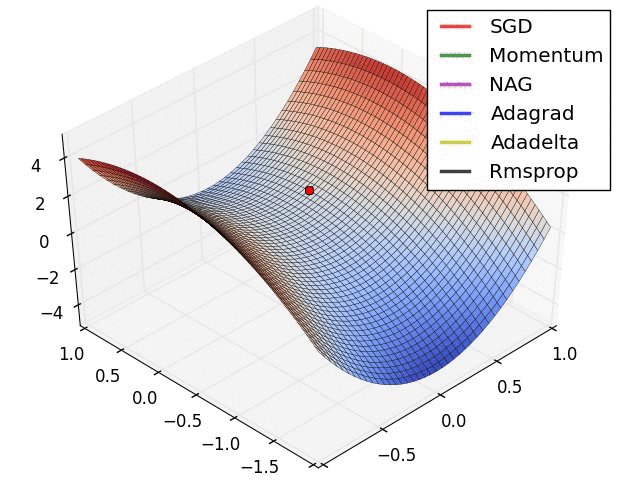

### 梯度下降法的挑戰

5、梯度下降法的挑戰
雖然梯度下降算法效果很好，並且廣泛使用，但同時其也存在一些挑戰與問題需要解決：

1）選擇一個合理的學習速率很難。如果學習速率過小，則會導致收斂速度很慢。如果學習速率過大，那麼其會阻礙收斂，即在極值點附近會振盪。

2）學習速率調整(又稱學習速率調度，Learning rate schedules)[11]試圖在每次更新過程中，改變學習速率，如退火。一般使用某種事先設定的策略或者在每次迭代中衰減一個較小的閾值。無論哪種調整方法，都需要事先進行固定設置，這邊便無法自適應每次學習的數據集特點。

3）模型所有的參數每次更新都是使用相同的學習速率。如果數據特徵是稀疏的或者每個特徵有著不同的取值統計特徵與空間，那麼便不能在每次更新中每個參數使用相同的學習速率，那些很少出現的特徵應該使用一個相對較大的學習速率。

4）對於非凸目標函數，容易陷入那些次優的局部極值點中，如在神經網路中。那麼如何避免呢。Dauphin指出更嚴重的問題不是局部極值點，而是鞍點(These saddle points are usually surrounded by a plateau of the same error, which makes it notoriously hard for SGD to escape, as the gradient is close to zero in all dimensions .)。

鞍點（Saddle Points）鞍點是指梯度為零但不是極小值的點，優化器需要能有效地避開這些點。


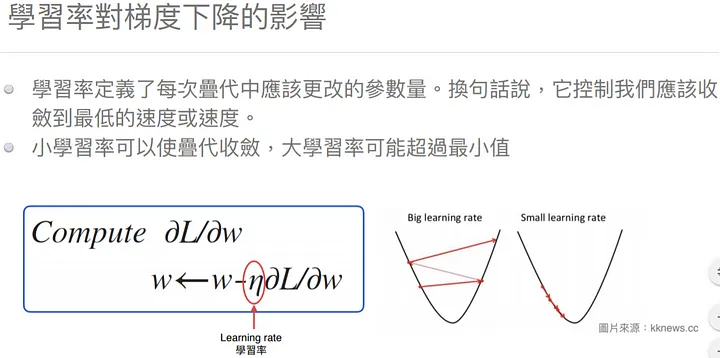

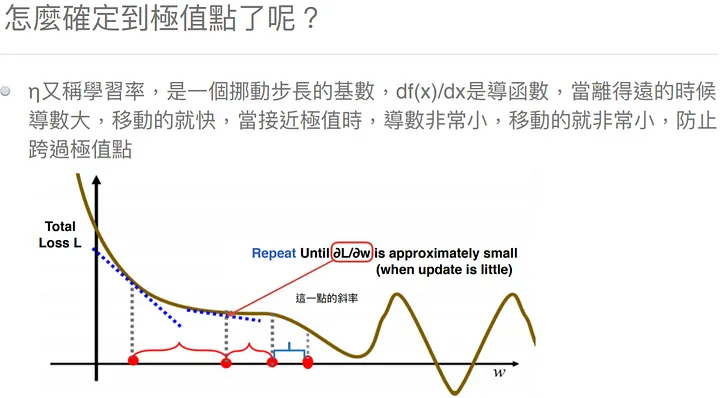

參考：

1. [機器/深度學習-基礎數學(二):梯度下降法(gradient descent)
](https://chih-sheng-huang821.medium.com/%E6%A9%9F%E5%99%A8%E5%AD%B8%E7%BF%92-%E5%9F%BA%E7%A4%8E%E6%95%B8%E5%AD%B8-%E4%BA%8C-%E6%A2%AF%E5%BA%A6%E4%B8%8B%E9%99%8D%E6%B3%95-gradient-descent-406e1fd001f)
2. [梯度下降學習法（Gradient Descent Learning Rule）
](https://medium.com/%E4%BA%BA%E5%B7%A5%E6%99%BA%E6%85%A7-%E5%80%92%E5%BA%95%E6%9C%89%E5%A4%9A%E6%99%BA%E6%85%A7/%E6%A2%AF%E5%BA%A6%E4%B8%8B%E9%99%8D%E5%AD%B8%E7%BF%92%E6%B3%95-gradient-descent-learning-rule-83e1915f76cb)
3. [機器學習Lesson 5 — 梯度的深度解析
](https://flag-editors.medium.com/%E6%A9%9F%E5%99%A8%E5%AD%B8%E7%BF%92lesson-5-%E6%A2%AF%E5%BA%A6%E7%9A%84%E6%B7%B1%E5%BA%A6%E8%A7%A3%E6%9E%90-eaa1434f5fcf)
4. [A Comprehensive Guide on Optimizers in Deep Learning
](https://www.analyticsvidhya.com/blog/2021/10/a-comprehensive-guide-on-deep-learning-optimizers/)

5. [我的機器學習手稿 — 更新模型參數
](https://jacob975.medium.com/%E6%88%91%E7%9A%84%E6%A9%9F%E5%99%A8%E5%AD%B8%E7%BF%92%E6%89%8B%E7%A8%BF-%E6%9B%B4%E6%96%B0%E6%A8%A1%E5%9E%8B%E5%8F%83%E6%95%B8-e74414bc385b)

補充：

並不是所有的機器學習模型都會使用梯度來優化參數。不同的模型有不同的參數優化方法。以下是一些常見的模型及其優化方法：

1. 使用梯度下降的模型
- **線性回歸（Linear Regression）**：通常使用普通最小二乘法（OLS），但在大數據集上可能會使用梯度下降。
- **邏輯回歸（Logistic Regression）**：使用梯度下降或變種如牛頓法來優化。
- **神經網絡（Neural Networks）**：使用變種的梯度下降方法（如SGD、Adam等）來更新權重。
- **支持向量機（SVM）**：對於非線性SVM，可以使用梯度下降方法來優化核函數。

2. 不使用梯度下降的模型
- **決策樹（Decision Trees）**：通過遞歸地分裂數據來構建樹，根據不同的分裂標準（如Gini不純度、信息增益）來決定最佳分裂點。
- **隨機森林（Random Forests）**：基於多個決策樹的集成方法，不使用梯度下降，而是依賴於決策樹的構建方法。
- **K最近鄰（K-Nearest Neighbors, KNN）**：這是一種基於距離的非參數方法，無需訓練過程，因此不涉及參數優化。
- **朴素貝葉斯（Naive Bayes）**：基於概率計算的分類方法，利用貝葉斯定理進行分類，不涉及梯度下降。
- **線性判別分析（Linear Discriminant Analysis, LDA）**和**二次判別分析（Quadratic Discriminant Analysis, QDA）**：這些方法基於數學公式來計算判別函數，不使用梯度下降。

3. 其他優化方法
- **遺傳算法（Genetic Algorithms）**：基於生物進化的概念，用於尋找全局最優解，不依賴於梯度信息。
- **粒子群優化（Particle Swarm Optimization, PSO）**：模擬鳥群覓食行為來優化參數，不依賴梯度。
- **牛頓法（Newton's Method）**：使用二階導數信息（Hessian矩陣）來優化參數，應用於一些需要更快收斂的情況。
- **二次規劃（Quadratic Programming, QP）**：用於解決某些凸優化問題，如線性SVM中的參數優化。

# 補充教材

### 你要知道的數學

[機器/深度學習-基礎數學篇(一)
](https://chih-sheng-huang821.medium.com/%E6%A9%9F%E5%99%A8%E5%AD%B8%E7%BF%92-%E5%9F%BA%E7%A4%8E%E6%95%B8%E5%AD%B8%E7%AF%87-%E4%B8%80-1c8337179ad6)

微積分找極值方式:

一般微積分說將要找極大值或極小值的式子做微分等於0找解，找到的不是極大值，就是極小值，是極大還是極小就看二階微分帶入找出來的解，看結果是大於0，還是小於0。



這邊舉個範例



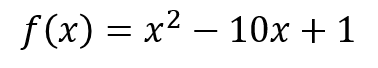


微分很簡單



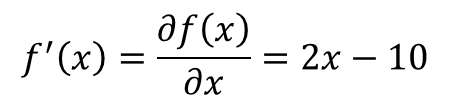


微分等於0


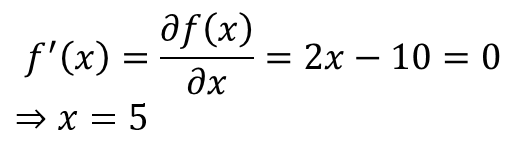



二階微分




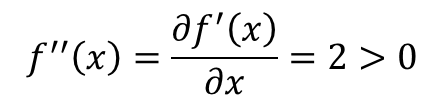

所以剛剛的式子找到的極值是極小值，當x=5，有極小值-24。


### 什麼是微分？

微分是微積分中的一個基本概念，用來研究函數的變化率。直觀上，微分可以理解為求某一點處的切線斜率。

### 基本概念

1. **函數（Function）**：一個函數 \( f(x) \) 表示輸入 \( x \) 和輸出 \( f(x) \) 之間的關係。例如， \( f(x) = x^2 \)。

2. **導數（Derivative）**：函數 \( f(x) \) 在點 \( x \) 處的導數 \( f'(x) \) 表示當 \( x \) 發生微小變化時， \( f(x) \) 的變化率。簡單地說，導數告訴我們函數在某一點的瞬時變化率或切線的斜率。

### 導數的定義

導數的數學定義是：
$$
f'(x) = \lim_{{h \to 0}} \frac{{f(x+h) - f(x)}}{h}
$$

這表示當 \( h \) 趨近於 0 時，函數 \( f(x) \) 的變化率。

### 基本導數規則

以下是一些常見函數的導數：

1. **常數函數**：若 \( f(x) = c \)，其中 \( c \) 是常數，則 \( f'(x) = 0 \)。
2. **幂函數**：若 \( f(x) = x^n \)，其中 \( n \) 是實數，則 \( f'(x) = nx^{n-1} \)。
3. **指數函數**：若 \( f(x) = e^x \)，則 \( f'(x) = e^x \)。
4. **對數函數**：若 \( f(x) = \ln(x) \)，則 \( f'(x) = \frac{1}{x} \)。
5. **正弦函數**：若 \( f(x) = \sin(x) \)，則 \( f'(x) = \cos(x) \)。
6. **餘弦函數**：若 \( f(x) = \cos(x) \)，則 \( f'(x) = -\sin(x) \)。

### 導數的基本性質

1. **線性性質**：
   - 若 \( f(x) \) 和 \( g(x) \) 都是可微函數，且 \( c \) 是常數，則
     $$
     (cf(x))' = cf'(x)
     $$
     $$
     (f(x) + g(x))' = f'(x) + g'(x)
     $$

2. **乘積法則（Product Rule）**：
   - 若 \( f(x) \) 和 \( g(x) \) 都是可微函數，則
     $$
     (f(x)g(x))' = f'(x)g(x) + f(x)g'(x)
     $$

3. **商法則（Quotient Rule）**：
   - 若 \( f(x) \) 和 \( g(x) \) 都是可微函數，且 \( g(x) \neq 0 \)，則
     $$
     \left( \frac{f(x)}{g(x)} \right)' = \frac{f'(x)g(x) - f(x)g'(x)}{(g(x))^2}
     $$

4. **鏈式法則（Chain Rule）**：
   - 若 \( y = f(u) \) 且 \( u = g(x) \)，則
     $$
     \frac{dy}{dx} = \frac{dy}{du} \cdot \frac{du}{dx}
     $$

### 簡單例子

1. **求 \( f(x) = x^2 \) 的導數**：
   $$
   f'(x) = \lim_{{h \to 0}} \frac{{(x+h)^2 - x^2}}{h} = \lim_{{h \to 0}} \frac{{x^2 + 2xh + h^2 - x^2}}{h} = \lim_{{h \to 0}} \frac{{2xh + h^2}}{h} = \lim_{{h \to 0}} (2x + h) = 2x
   $$

2. **求 \( f(x) = \sin(x) \) 的導數**：
   $$
   f'(x) = \cos(x)
   $$


# References